# Project 586_Customer_Segmentation
# Title - Customer Personality Analysis
# Week - 3 - Complete EDA, Modeling, Evaluation & Streamlit Deployment

In [2]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
import joblib
from pathlib import Path

In [3]:
DATA_PATH = "/mnt/data/marketing_campaign.xlsx"  # update if different
OUT_DIR = "/content/cluster_outputs"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)
random_state = 42

# Automated EDA (ydata-profiling)

In [1]:
!pip install ydata_profiling --upgrade

import pandas as pd
from ydata_profiling import ProfileReport

# Load dataset
df = pd.read_excel("marketing_campaign.xlsx")

profile = ProfileReport (df, title = "Customer Personality EDA Report", explorative = True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:00<00:00, 43.08it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# EDA — Data Exploration

In [4]:
# Manual EDA — Data Exploration: Basic checks, data types, missingness, distributions
def manual_eda(df):
    print("=== Basic Info ===")
    print("Shape:", df.shape)
    display(df.head(5))
    display(df.info())

    print("\n=== Describe numeric ===")
    display(df.describe().T)

    print("\n=== Missing Values ===")
    missing = df.isna().sum().sort_values(ascending=False)
    missing_percent = (missing / len(df) * 100).round(2)
    pd.concat([missing, missing_percent], axis=1).rename(columns={0:'missing_count',1:'missing_pct'})
    display(missing[missing > 0])

    print("\n=== Unique Values (sample) ===")
    for col in df.columns:
        if df[col].nunique() < 10:
            print(f"{col}: {df[col].unique()}")
manual_eda(df)

# Duplicates
print("Duplicates:", df.duplicated().sum())

=== Basic Info ===
Shape: (2240, 29)


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

None


=== Describe numeric ===


,count,mean,min,25%,50%,75%,max,std
ID,2240.0,5592.159821,0.0,2828.25,5458.5,8427.75,11191.0,3246.662198
Year_Birth,2240.0,1968.805804,1893.0,1959.0,1970.0,1977.0,1996.0,11.984069
Income,2216.0,52247.251354,1730.0,35303.0,51381.5,68522.0,666666.0,25173.076661
Kidhome,2240.0,0.444196,0.0,0.0,0.0,1.0,2.0,0.538398
Teenhome,2240.0,0.50625,0.0,0.0,0.0,1.0,2.0,0.544538
Dt_Customer,2240,2013-07-10 10:01:42.857142784,2012-07-30 00:00:00,2013-01-16 00:00:00,2013-07-08 12:00:00,2013-12-30 06:00:00,2014-06-29 00:00:00,NaN
Recency,2240.0,49.109375,0.0,24.0,49.0,74.0,99.0,28.962453
MntWines,2240.0,303.935714,0.0,23.75,173.5,504.25,1493.0,336.597393
MntFruits,2240.0,26.302232,0.0,1.0,8.0,33.0,199.0,39.773434
MntMeatProducts,2240.0,166.95,0.0,16.0,67.0,232.0,1725.0,225.715373



=== Missing Values ===


,0
Income,24



=== Unique Values (sample) ===
Education: ['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']
Marital_Status: ['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']
Kidhome: [0 1 2]
Teenhome: [0 1 2]
AcceptedCmp3: [0 1]
AcceptedCmp4: [0 1]
AcceptedCmp5: [0 1]
AcceptedCmp1: [0 1]
AcceptedCmp2: [0 1]
Complain: [0 1]
Z_CostContact: [3]
Z_Revenue: [11]
Response: [1 0]
Duplicates: 0


# Data Cleaning & Feature Creation

In [5]:
# Handle missing income values
df = df.dropna(subset=['Income'])

# Remove duplicates
df = df.drop_duplicates()

# Feature Engineering

In [6]:
# Feature engineering

# Convert date field
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df['Age'] = 2025 - df['Year_Birth']

# Create new feature: Customer tenure
df['Customer_For'] = (df['Dt_Customer'].max() - df['Dt_Customer']).dt.days
df['TotalKids'] = df['Kidhome'] + df['Teenhome']

# Total spending
spend_cols = ['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']
df['TotalSpend'] = df[spend_cols].sum(axis=1)

# Example derived metrics
df['AvgSpendPerPurchase'] = df['TotalSpend'] / (1 + df[['NumWebPurchases','NumCatalogPurchases','NumStorePurchases']].sum(axis=1))

# Drop unnecessary columns
df = df.drop(columns=['Z_CostContact', 'Z_Revenue'], errors='ignore')

# Reset index after cleaning
df.reset_index(drop=True, inplace=True)

# Data Visualization

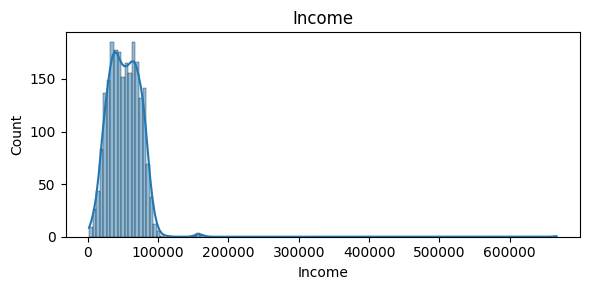

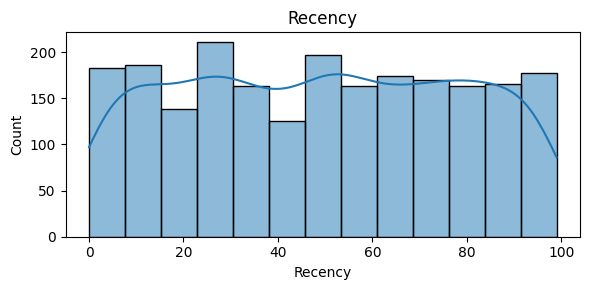

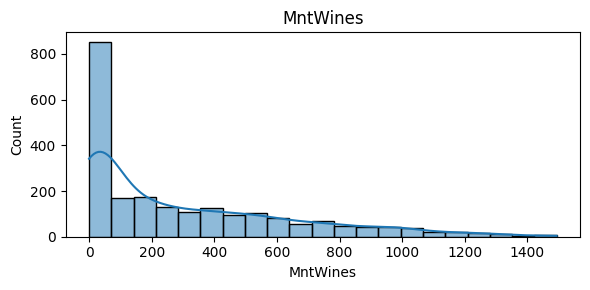

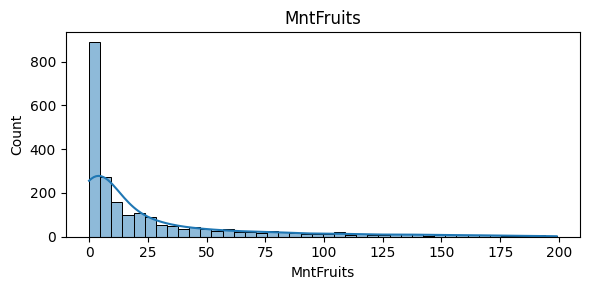

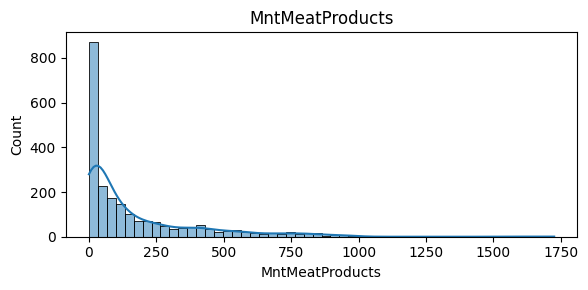

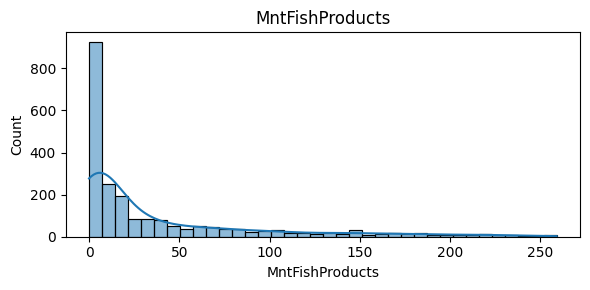

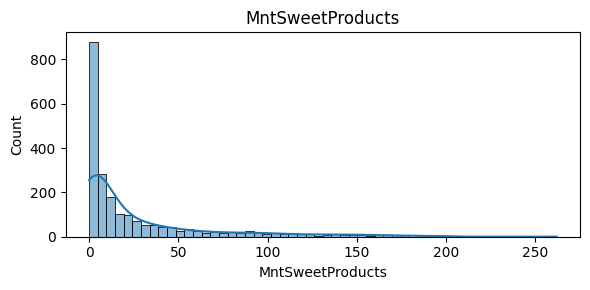

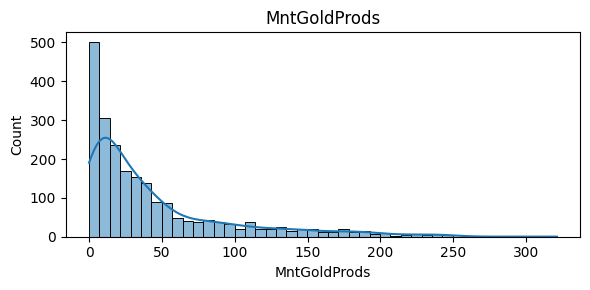

In [7]:
# 1. Distribution plots for numeric variables
import matplotlib.pyplot as plt # Import matplotlib.pyplot here
import seaborn as sns # Import seaborn here
import os

# Create the 'plots' directory if it doesn't exist
if not os.path.exists('plots'):
    os.makedirs('plots')


num_cols = ['Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']
for c in num_cols:
    plt.figure(figsize=(6,3))
    sns.histplot(df[c].dropna(), kde=True)
    plt.title(c)
    plt.tight_layout()
    plt.show()

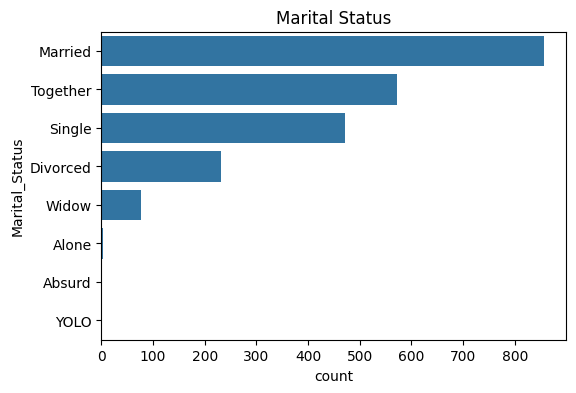

In [8]:
# 2. Categorical counts
plt.figure(figsize=(6,4))
sns.countplot(y='Marital_Status', data=df, order=df['Marital_Status'].value_counts().index)
plt.title('Marital Status')
plt.show()

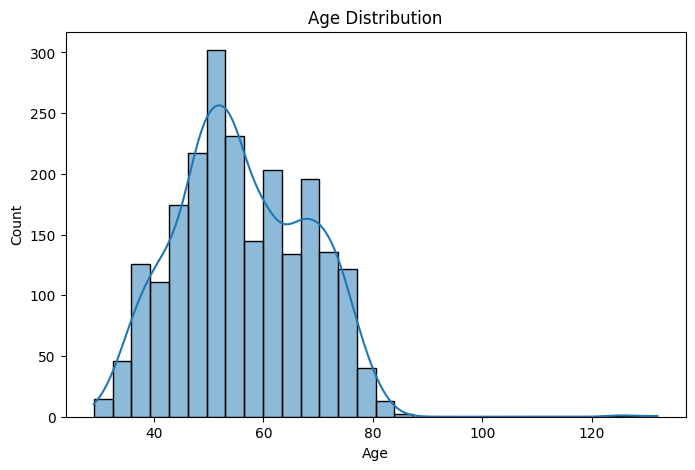

Observation: Most customers are between 35–60 years old


In [9]:
# Univariate & Bivariate Analysis
# Age Distribution
plt.figure(figsize=(8,5))
sns.histplot(df['Age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.show()

print ("Observation: Most customers are between 35–60 years old")

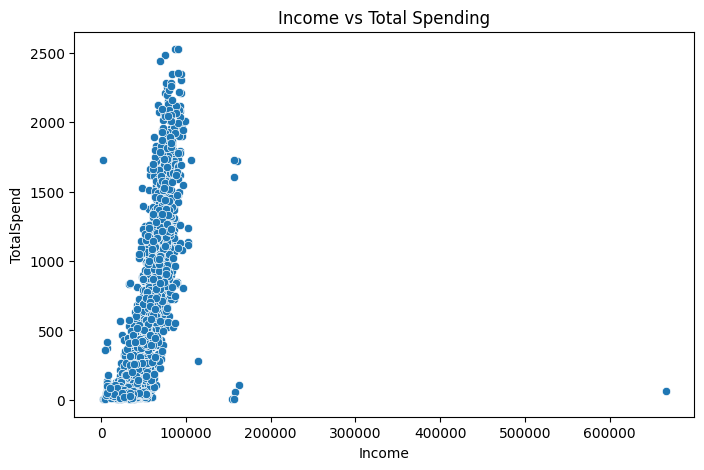

Observation: Positive relationship — higher income leads to higher total spend.


In [10]:
# Income vs Total Spending
plt.figure(figsize=(8,5))
sns.scatterplot(x='Income', y='TotalSpend', data=df)
plt.title('Income vs Total Spending')
plt.show()

print ("Observation: Positive relationship — higher income leads to higher total spend.")

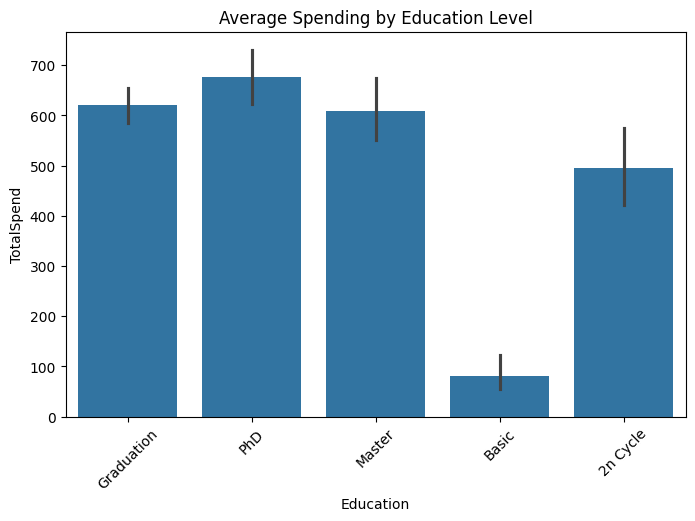

Observation: Graduate and PhD customers spend the most.


In [11]:
# Average Spending by Education
import numpy as np
plt.figure(figsize=(8,5))
sns.barplot(x='Education', y='TotalSpend', data=df, estimator=np.mean)
plt.xticks(rotation=45)
plt.title('Average Spending by Education Level')
plt.show()

print ("Observation: Graduate and PhD customers spend the most.")

# Correlation Analysis

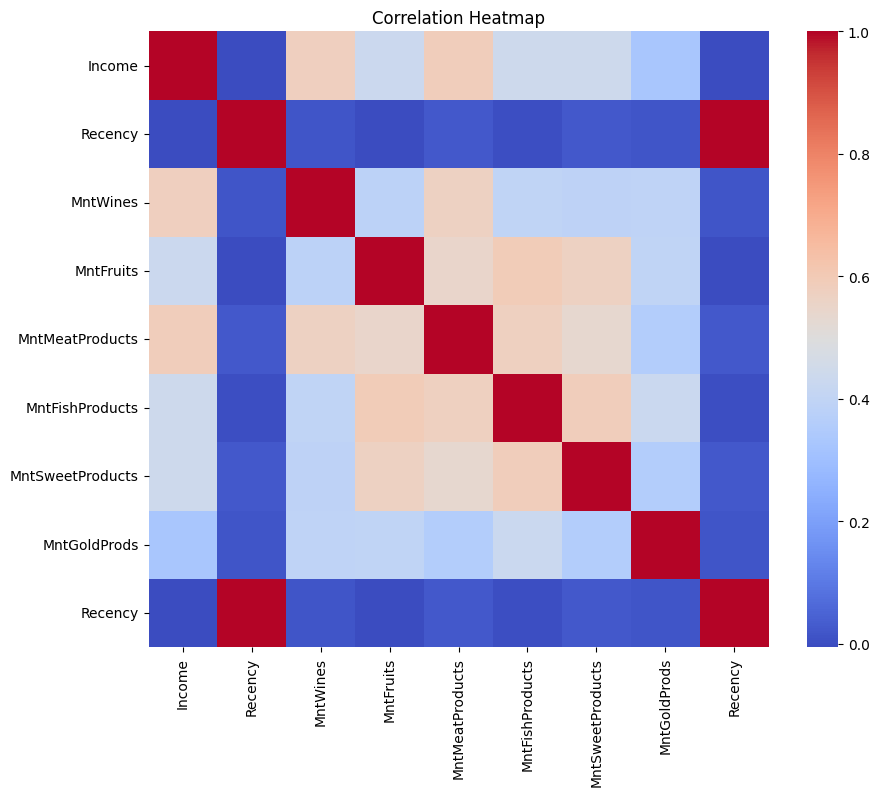

In [12]:
# Correlation heatmap (numeric)
plt.figure(figsize=(10,8))
sns.heatmap(df[num_cols + ['Recency']].corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

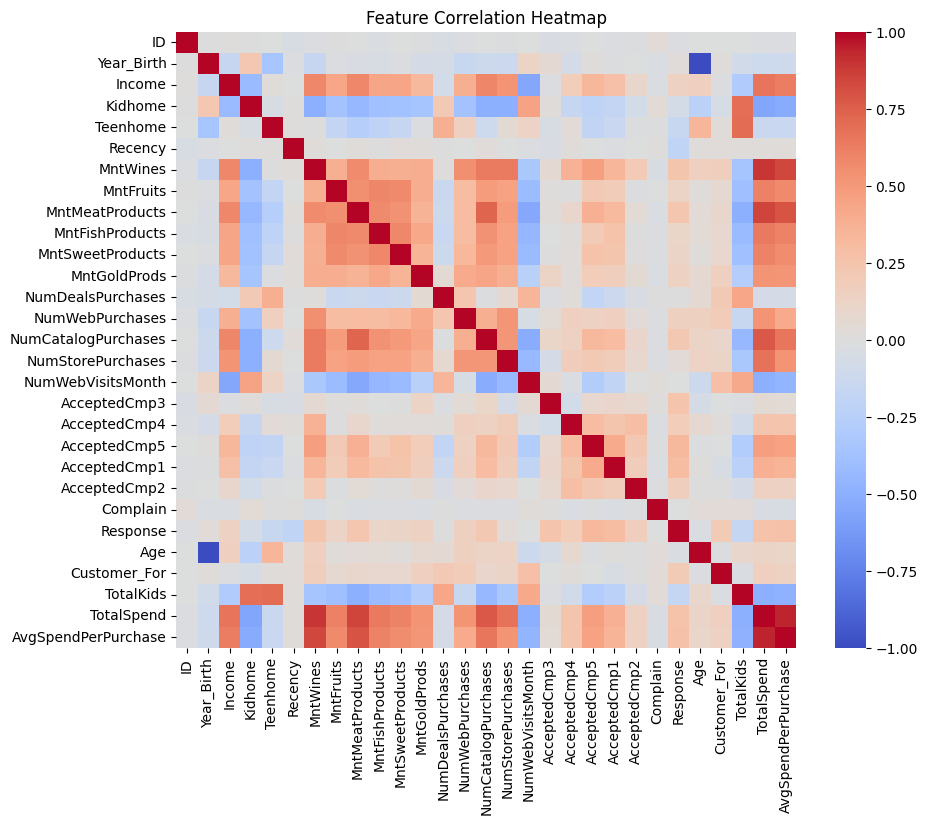

Observation 1:Income, Age, and TotalSpend are key influencing factors.
Observation 2: Some product categories are correlated — e.g., Meat and Wine.


In [13]:
# Correlationa Analysis
plt.figure(figsize=(10,8))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title('Feature Correlation Heatmap')
plt.show()

print ("Observation 1:Income, Age, and TotalSpend are key influencing factors.")
print ("Observation 2: Some product categories are correlated — e.g., Meat and Wine.")

# Preprocessing Pipeline (scaling, encoding)

In [14]:
# Decide features for clustering
# Typical marketing campaign dataset: age, income, purchases, spending, campaign response, etc.
# We'll auto-detect numerical vs categorical. You can override here if you know columns.

num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
print("Numerical columns:", num_cols)
print("Categorical columns:", cat_cols)

Numerical columns: ['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_For', 'TotalKids', 'TotalSpend', 'AvgSpendPerPurchase']
Categorical columns: ['Education', 'Marital_Status']


In [15]:
# Preprocessing pipeline
# For numeric: impute median, scale (StandardScaler)
# For categorical: impute most frequent, one-hot encode
numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])
preprocessor = ColumnTransformer(transformers=[
    ("num", numeric_transformer, num_cols),
    ("cat", categorical_transformer, cat_cols)
])
# Fit and transform
X = preprocessor.fit_transform(df)
# If one-hot created columns, we might want column names for later explanation
ohe_cols = []
if cat_cols:
    ohe = preprocessor.named_transformers_["cat"].named_steps["onehot"]
    cat_ohe_names = ohe.get_feature_names_out(cat_cols).tolist()
else:
    cat_ohe_names = []
feature_names = num_cols + cat_ohe_names
X.shape, len(feature_names)

((2216, 42), 42)

# Dimensionality reduction for visualization & noise removal

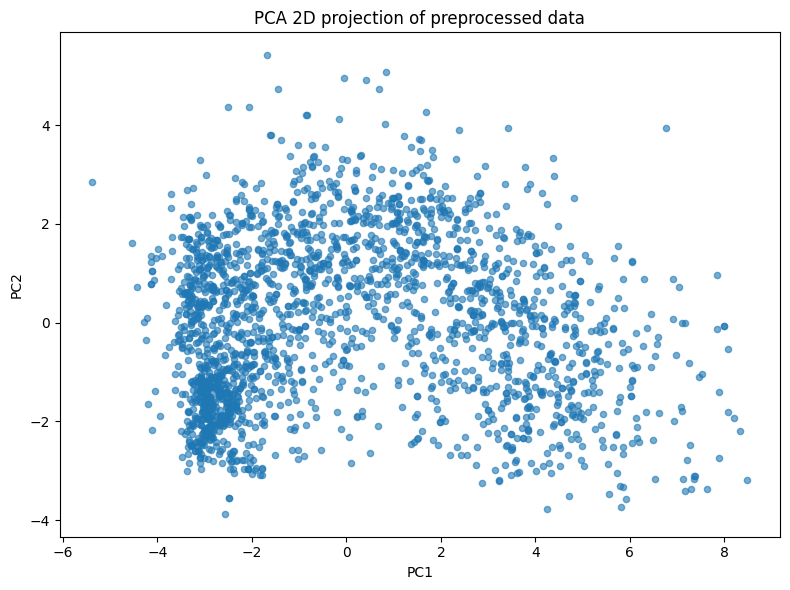

In [16]:
# Reduce dimensionality for visualization (PCA to 2D)
random_state = 42 # Define random_state
pca = PCA(n_components=2, random_state=random_state)
X_pca = pca.fit_transform(X)
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], s=20, alpha=0.6)
plt.title("PCA 2D projection of preprocessed data")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "pca_2d.png"))
plt.show()

In [17]:
# Define helper functions for model evaluation & tuning
def evaluate_clustering(X, labels):
    """Return silhouette, davies_bouldin, calinski_harabasz"""
    # If single cluster or label noise (-1 only), metrics may fail. Guard.
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels[unique_labels != -1])
    if n_clusters <= 1:
        return {"n_clusters": n_clusters,
                "silhouette": -1,
                "davies_bouldin": np.inf,
                "calinski_harabasz": -1}
    sil = silhouette_score(X, labels)
    db = davies_bouldin_score(X, labels)
    ch = calinski_harabasz_score(X, labels)
    return {"n_clusters": n_clusters, "silhouette": sil, "davies_bouldin": db, "calinski_harabasz": ch}

def score_and_report_model(name, labels, X_for_eval, store=True):
    metrics = evaluate_clustering(X_for_eval, labels)
    print(f"Model: {name} -> clusters: {metrics['n_clusters']}, silhouette: {metrics['silhouette']:.4f}, "
          f"davies_bouldin: {metrics['davies_bouldin']:.4f}, calinski_harabasz: {metrics['calinski_harabasz']:.4f}")
    return metrics

# Model Tuning & Feature Engineering
## Build and Tune 4 Clustering Models

### 1. K-Means (Elbow + silhouette)
### 2. Hierarchical (Agglomerative Clustering) - tune k and linkage
### 3. DBSCAN - tune eps and min_samples
### 4. Gaussian Mixture Model (GMM) - tune n_components and covariance_type

# We evaluate with:

## Silhouette Score (primary)
## Calinski-Harabasz (secondary, higher better)
## Davies-Bouldin (secondary, lower better)

# Model 1 - K-Means tuning

In [18]:
# MODEL 1: KMeans - grid search over k
k_candidates = list(range(2, 11))  # try 2..10
kmeans_results = []
for k in k_candidates:
    km = KMeans(n_clusters=k, random_state=random_state, n_init=10)
    labels = km.fit_predict(X)
    metrics = evaluate_clustering(X, labels)
    metrics.update({"k": k, "model": "KMeans"})
    kmeans_results.append((km, metrics))
# summarize
kdf = pd.DataFrame([m for _, m in kmeans_results])
kdf = kdf.sort_values(by="silhouette", ascending=False).reset_index(drop=True)
display(kdf)
best_km, best_km_metrics = kmeans_results[kdf.index[0]]
print("Best KMeans:", best_km_metrics)
# Save best KMeans
joblib.dump(best_km, os.path.join(OUT_DIR, "kmeans_best.joblib"))

,n_clusters,silhouette,davies_bouldin,calinski_harabasz,k,model
0,2,0.242730,1.779529,629.008661,2,KMeans
1,4,0.159766,2.260504,351.053072,4,KMeans
2,3,0.158281,2.203169,440.097514,3,KMeans
3,8,0.119350,1.872051,239.317806,8,KMeans
4,7,0.116819,1.937261,261.037286,7,KMeans
5,6,0.112419,2.145086,275.958963,6,KMeans
6,9,0.112010,2.150355,219.199405,9,KMeans
7,10,0.108190,2.126121,208.087869,10,KMeans
8,5,0.106044,2.325481,304.236491,5,KMeans


Best KMeans: {'n_clusters': 2, 'silhouette': np.float64(0.24273003209511082), 'davies_bouldin': np.float64(1.779529423034379), 'calinski_harabasz': np.float64(629.0086609094419), 'k': 2, 'model': 'KMeans'}


['/content/cluster_outputs/kmeans_best.joblib']

# Model 2 - Agglomerative tuning

In [19]:
# MODEL 2: Agglomerative Clustering (Hierarchical)
# We'll experiment with different numbers of clusters and linkage
agglom_results = []
for k in k_candidates:
    for linkage in ["ward", "complete", "average", "single"]:
        # ward requires euclidean and numerical only - safe because we've preprocessed to numeric matrix
        try:
            ag = AgglomerativeClustering(n_clusters=k, linkage=linkage)
            labels = ag.fit_predict(X)
            metrics = evaluate_clustering(X, labels)
            metrics.update({"k": k, "linkage": linkage, "model": "Agglomerative"})
            agglom_results.append((ag, metrics))
        except Exception as e:
            # some linkages may fail for certain data shapes; skip gracefully
            continue
agdf = pd.DataFrame([m for _, m in agglom_results]).sort_values(by="silhouette", ascending=False).reset_index(drop=True)
display(agdf.head(10))
best_ag_index = 0 if agglom_results else None
if best_ag_index is not None:
    best_ag, best_ag_metrics = agglom_results[agdf.index[0]]
    joblib.dump(best_ag, os.path.join(OUT_DIR, "agglomerative_best.joblib"))
    print("Best Agglomerative:", best_ag_metrics)

,n_clusters,silhouette,davies_bouldin,calinski_harabasz,k,linkage,model
0,2,0.708515,0.210153,20.209827,2,complete,Agglomerative
1,2,0.708515,0.210153,20.209827,2,average,Agglomerative
2,2,0.708515,0.210153,20.209827,2,single,Agglomerative
3,3,0.494931,0.603801,20.803763,3,average,Agglomerative
4,4,0.433532,0.806336,48.878230,4,average,Agglomerative
5,3,0.431708,0.704772,49.203721,3,single,Agglomerative
6,3,0.431372,0.753879,13.826982,3,complete,Agglomerative
7,4,0.429360,0.726772,40.426145,4,single,Agglomerative
8,4,0.423455,0.764803,16.392420,4,complete,Agglomerative
9,5,0.421203,0.830469,58.461326,5,average,Agglomerative


Best Agglomerative: {'n_clusters': 2, 'silhouette': np.float64(0.19560838208375197), 'davies_bouldin': np.float64(1.9806343796165489), 'calinski_harabasz': np.float64(500.20312632481597), 'k': 2, 'linkage': 'ward', 'model': 'Agglomerative'}


# Model 3 - DBSCAN tuning (density-based)

In [20]:
# MODEL 3: DBSCAN - tune eps & min_samples
dbscan_results = []
eps_list = np.linspace(0.2, 2.0, 10)  # depends on scaling; we used StandardScaler
min_samples_list = [3, 5, 8, 10]
for eps in eps_list:
    for ms in min_samples_list:
        db = DBSCAN(eps=eps, min_samples=ms)
        labels = db.fit_predict(X)
        metrics = evaluate_clustering(X, labels)
        metrics.update({"eps": eps, "min_samples": ms, "model": "DBSCAN"})
        dbscan_results.append((db, metrics))
dbdf = pd.DataFrame([m for _, m in dbscan_results]).sort_values(by="silhouette", ascending=False).reset_index(drop=True)
display(dbdf.head(10))
best_db = dbscan_results[dbdf.index[0]][0]
joblib.dump(best_db, os.path.join(OUT_DIR, "dbscan_best.joblib"))
print("Best DBSCAN:", dbdf.iloc[0].to_dict())

,n_clusters,silhouette,davies_bouldin,calinski_harabasz,eps,min_samples,model
0,2,-0.114517,1.943829,71.146175,2.0,10,DBSCAN
1,3,-0.120807,1.815489,55.275921,2.0,8,DBSCAN
2,2,-0.161690,1.870650,35.554133,1.8,8,DBSCAN
3,9,-0.175040,1.829049,26.683295,2.0,5,DBSCAN
4,7,-0.176530,1.682672,17.894512,1.8,5,DBSCAN
5,6,-0.196103,1.722515,6.086168,1.6,8,DBSCAN
6,2,-0.215753,1.351707,1.784447,0.8,3,DBSCAN
7,2,-0.215753,1.351707,1.784447,0.6,3,DBSCAN
8,8,-0.216571,1.552736,3.222916,1.4,5,DBSCAN
9,10,-0.219039,1.638416,6.081756,1.6,5,DBSCAN


Best DBSCAN: {'n_clusters': 2, 'silhouette': -0.11451729817186783, 'davies_bouldin': 1.9438292640650625, 'calinski_harabasz': 71.1461750322252, 'eps': 2.0, 'min_samples': 10, 'model': 'DBSCAN'}


# Model 4 - GMM tuning (soft clustering)

In [21]:
# MODEL 4: Gaussian Mixture (GMM)
gmm_results = []
for k in k_candidates:
    for cov_type in ["full", "tied", "diag", "spherical"]:
        try:
            gm = GaussianMixture(n_components=k, covariance_type=cov_type, random_state=random_state, n_init=3)
            labels = gm.fit_predict(X)
            metrics = evaluate_clustering(X, labels)
            metrics.update({"k": k, "cov_type": cov_type, "model": "GMM"})
            gmm_results.append((gm, metrics))
        except Exception:
            continue
gdf = pd.DataFrame([m for _, m in gmm_results]).sort_values(by="silhouette", ascending=False).reset_index(drop=True)
display(gdf.head(10))
best_gm = gmm_results[gdf.index[0]][0]
joblib.dump(best_gm, os.path.join(OUT_DIR, "gmm_best.joblib"))
print("Best GMM:", gdf.iloc[0].to_dict())

,n_clusters,silhouette,davies_bouldin,calinski_harabasz,k,cov_type,model
0,2,0.243994,1.872457,563.498730,2,full,GMM
1,2,0.232646,1.855010,581.516620,2,diag,GMM
2,2,0.228184,1.823097,590.795590,2,tied,GMM
3,2,0.213983,1.886694,547.236885,2,spherical,GMM
4,4,0.189431,2.644902,265.543453,4,full,GMM
5,3,0.179712,2.472540,370.833260,3,full,GMM
6,3,0.169207,2.306324,374.686928,3,diag,GMM
7,4,0.150336,3.969934,250.213761,4,diag,GMM
8,4,0.144822,2.302851,329.828072,4,tied,GMM
9,3,0.139949,2.400517,378.387063,3,tied,GMM


Best GMM: {'n_clusters': 2, 'silhouette': 0.24399354196769835, 'davies_bouldin': 1.8724574097895816, 'calinski_harabasz': 563.4987304339343, 'k': 2, 'cov_type': 'full', 'model': 'GMM'}


# Model Comparison & Select Best

In [22]:
# Compare best models: pick best by silhouette (and then davies_bouldin)
best_models = []
# load metrics from the dataframes above
for df_res, tag in [(kdf, "KMeans"), (agdf, "Agglomerative"), (dbdf, "DBSCAN"), (gdf, "GMM")]:
    if df_res is None or df_res.shape[0]==0:
        continue
    top = df_res.iloc[0].to_dict()
    top["model_type"] = tag
    best_models.append(top)
compare_df = pd.DataFrame(best_models).sort_values(by="silhouette", ascending=False).reset_index(drop=True)
display(compare_df)
# pick top model name
if not compare_df.empty:
    best_overall = compare_df.iloc[0]
    print("Best overall:", best_overall.to_dict())

,n_clusters,silhouette,davies_bouldin,calinski_harabasz,k,model,model_type,linkage,eps,min_samples,cov_type
0,2,0.708515,0.210153,20.209827,2.0,Agglomerative,Agglomerative,complete,NaN,NaN,NaN
1,2,0.243994,1.872457,563.498730,2.0,GMM,GMM,NaN,NaN,NaN,full
2,2,0.242730,1.779529,629.008661,2.0,KMeans,KMeans,NaN,NaN,NaN,NaN
3,2,-0.114517,1.943829,71.146175,NaN,DBSCAN,DBSCAN,NaN,2.0,10.0,NaN


Best overall: {'n_clusters': 2, 'silhouette': 0.708514614198335, 'davies_bouldin': 0.21015316534782302, 'calinski_harabasz': 20.20982663749239, 'k': 2.0, 'model': 'Agglomerative', 'model_type': 'Agglomerative', 'linkage': 'complete', 'eps': nan, 'min_samples': nan, 'cov_type': nan}


# Fit & Save the Best Model

In [23]:
# Attach cluster labels using best overall model
# Map back: determine which saved model to use
model_files = {
    "KMeans": os.path.join(OUT_DIR, "kmeans_best.joblib"),
    "Agglomerative": os.path.join(OUT_DIR, "agglomerative_best.joblib"),
    "DBSCAN": os.path.join(OUT_DIR, "dbscan_best.joblib"),
    "GMM": os.path.join(OUT_DIR, "gmm_best.joblib")
}
if not compare_df.empty:
    chosen = compare_df.iloc[0]["model_type"]
    chosen_model = joblib.load(model_files[chosen])
    if chosen == "GMM":
        labels = chosen_model.predict(X)
    else:
        # some scikit models (Agglomerative) may not have predict; use fit_predict
        try:
            labels = chosen_model.predict(X)
        except Exception:
            labels = chosen_model.fit_predict(X)
    df["cluster"] = labels
    df.to_csv(os.path.join(OUT_DIR, "data_with_clusters.csv"), index=False)
    print("Saved data with cluster labels to", os.path.join(OUT_DIR, "data_with_clusters.csv"))
else:
    print("No model selected (empty compare_df).")

Saved data with cluster labels to /content/cluster_outputs/data_with_clusters.csv


# Cluster Profiling

In [24]:
# Profiling clusters: sizes and simple summary
if "cluster" in df.columns:
    display(df.groupby("cluster").size().reset_index(name="count"))
    # summary stats per cluster (numeric)
    display(df.groupby("cluster")[num_cols].mean().T)

,cluster,count
0,0,977
1,1,1239


cluster,0,1
ID,5738.466735,5469.983051
Year_Birth,1966.459570,1970.682002
Income,69600.418628,38563.599677
Kidhome,0.045036,0.754641
Teenhome,0.515865,0.497175
Recency,49.666325,48.497175
MntWines,557.524053,106.038741
MntFruits,48.938588,8.548830
MntMeatProducts,320.268168,46.134786
MntFishProducts,69.988741,12.127522


In [25]:
# Save preprocessor and scaler (we saved the ColumnTransformer)
joblib.dump(preprocessor, os.path.join(OUT_DIR, "preprocessor.joblib"))
print("Saved preprocessor to:", os.path.join(OUT_DIR, "preprocessor.joblib"))
# Save best overall model object
if not compare_df.empty:
    best_model_file = os.path.join(OUT_DIR, f"best_model_{chosen}.joblib")
    joblib.dump(chosen_model, best_model_file)
    print("Saved chosen model to:", best_model_file)

Saved preprocessor to: /content/cluster_outputs/preprocessor.joblib
Saved chosen model to: /content/cluster_outputs/best_model_Agglomerative.joblib
